### Annotation 细胞注释

In [8]:
import scanpy as sc
import pandas as pd
import numpy as np
import os
from scipy.sparse import csr_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import celltypist
from celltypist import models
import scarches as sca
import urllib.request

In [9]:
import warnings

warnings.filterwarnings("ignore", category=DeprecationWarning)

import numba
from numba.core.errors import NumbaDeprecationWarning, NumbaPendingDeprecationWarning

warnings.simplefilter("ignore", category=NumbaDeprecationWarning)

warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)

In [10]:
sc.set_figure_params(figsize=(5, 5))

In [11]:
adata = sc.read(
    filename="s4d8_clustered.h5ad",
)
adata

AnnData object with n_obs × n_vars = 9370 × 31208
    obs: 'site', 'donor', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'DF_score', 'batch', 'size_factors'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant'
    layers: 'scran_normalization'

### 手动注释

##### 从标记marker注释细胞簇

In [12]:
marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    "ID2-hi myeloid prog": [
        "CD14",
        "ID2",
        "VCAN",
        "S100A9",
        "CLEC12A",
        "KLF4",
        "PLAUR",
    ],
    "cDC1": ["CLEC9A", "CADM1"],
    "cDC2": [
        "CST3",
        "COTL1",
        "LYZ",
        "DMXL2",
        "CLEC10A",
        "FCER1A",
    ],  # Note: DMXL2 should be negative
    "Normoblast": ["SLC4A1", "SLC25A37", "HBB", "HBA2", "HBA1", "TFRC"],
    "Erythroblast": ["MKI67", "HBA1", "HBB"],
    "Proerythroblast": [
        "CDK6",
        "SYNGR1",
        "HBM",
        "GYPA",
    ],  # Note HBM and GYPA are negative markers
    "NK": ["GNLY", "NKG7", "CD247", "GRIK4", "FCER1G", "TYROBP", "KLRG1", "FCGR3A"],
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    "Lymph prog": [
        "VPREB1",
        "MME",
        "EBF1",
        "SSBP2",
        "BACH2",
        "CD79B",
        "IGHM",
        "PAX5",
        "PRKCE",
        "DNTT",
        "IGLL1",
    ],
    "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    "B1 B": [
        "MS4A1",
        "SSPN",
        "ITGB1",
        "EPHA4",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "CD38",
        "XBP1",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
        "ZNF215",
    ],  # Note IGHD and IGHM are negative markers
    "Transitional B": ["MME", "CD38", "CD24", "ACSM3", "MSI2"],
    "Plasma cells": ["MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", "JCHAIN"],
    "Plasmablast": ["XBP1", "RF4", "PRDM1", "PAX5"],  # Note PAX5 is a negative marker
    "CD4+ T activated": ["CD4", "IL7R", "TRBC2", "ITGB1"],
    "CD4+ T naive": ["CD4", "IL7R", "TRBC2", "CCR7"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T activation": ["CD69", "CD38"],  # CD69 much better marker!
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
    "G/M prog": ["MPO", "BCL2", "KCNQ5", "CSF3R"],
    "HSC": ["NRIP1", "MECOM", "PROM1", "NKAIN2", "CD34"],
    "MK/E prog": [
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ],  # Note PLCB1 is a negative marker
}

In [13]:
# 仅保留在数据中检测到的标记的子集。循环遍历所有细胞类型，并仅保留在adata对象中找到的基因作为该细胞类型的标记。
# 初始化一个空字典，用于存储在数据集中找到的标记基因
marker_genes_in_data = dict()

# 遍历预定义的标记基因字典（marker_genes），ct为细胞类型，markers为该类型对应的标记基因列表
for ct, markers in marker_genes.items():
    # 初始化一个空列表，用于存储在当前数据集中找到的标记基因
    markers_found = list()

    # 遍历该细胞类型的标记基因列表
    for marker in markers:
        # 检查标记基因是否存在于数据集的基因列表（adata.var.index）中
        if marker in adata.var.index:
            # 如果存在，将该标记基因添加到markers_found列表中
            markers_found.append(marker)

    # 将该细胞类型及其找到的标记基因存入字典中
    marker_genes_in_data[ct] = markers_found

In [14]:
# 将原始计数数据（adata.X）存储到adata.layers["counts"]中，以便后续分析
adata.layers["counts"] = adata.X

# 将归一化后的数据（scran_normalization）赋值给adata.X，用于后续分析
adata.X = adata.layers["scran_normalization"]

In [15]:
# 将高变基因的标记（highly_deviant）赋值给adata.var["highly_variable"]，用于后续降维
adata.var["highly_variable"] = adata.var["highly_deviant"]

In [16]:
# 使用PCA降维，提取前50个主成分（n_comps=50），并仅使用高变基因（use_highly_variable=True）
sc.tl.pca(adata, n_comps=50, use_highly_variable=True)

In [17]:
# 构建KNN图，用于后续的UMAP降维和聚类
sc.pp.neighbors(adata)

In [18]:
# 使用UMAP进行非线性降维，将数据映射到二维空间
sc.tl.umap(adata)

NAIVE CD20+ B:


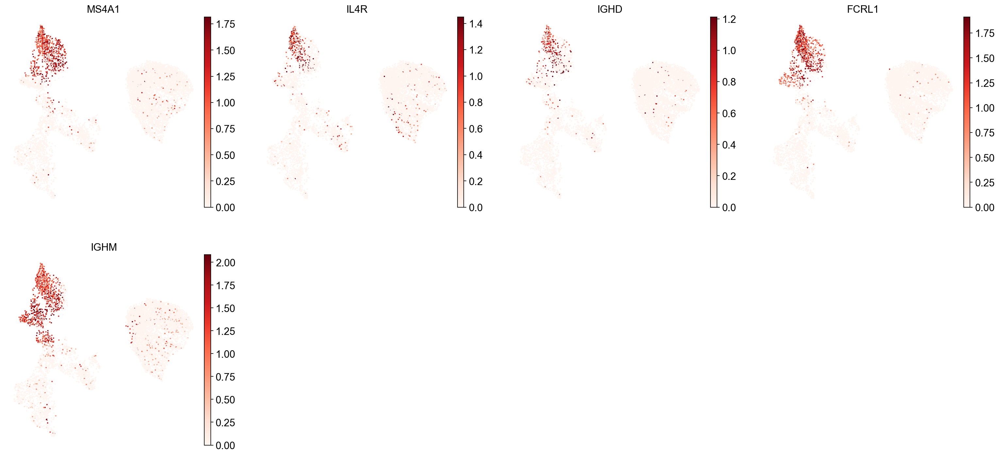





B1 B:


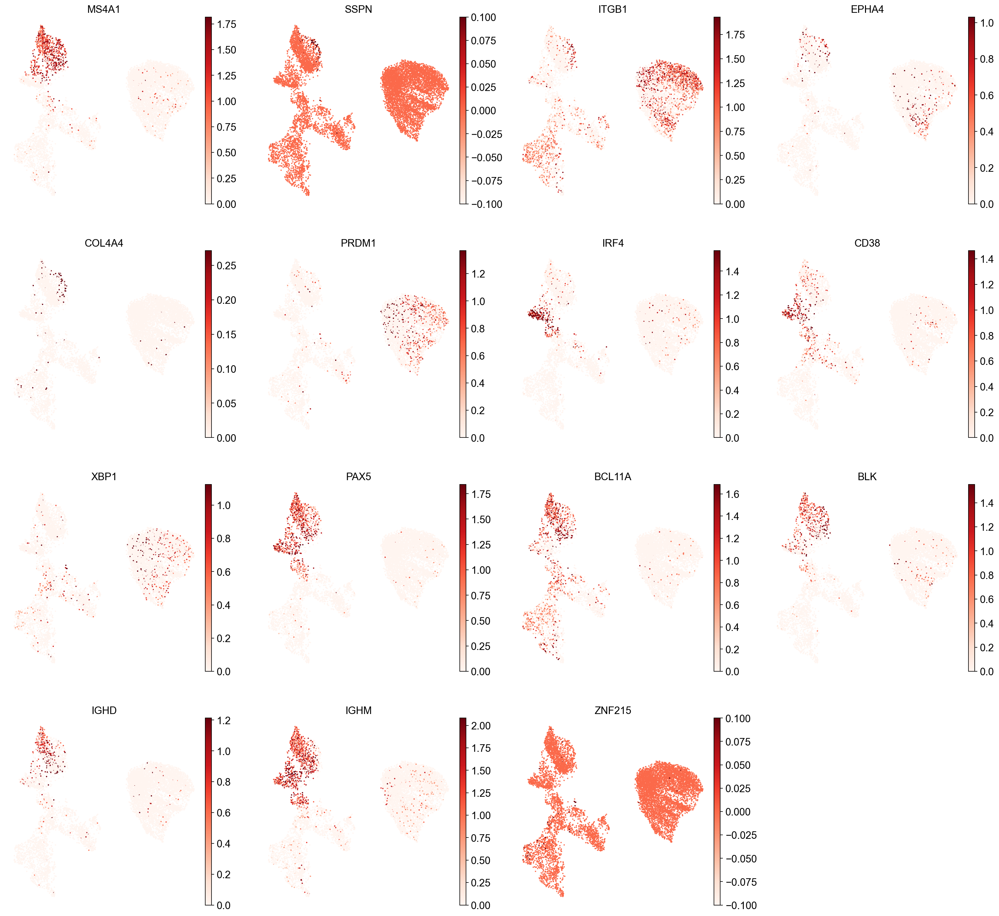





TRANSITIONAL B:


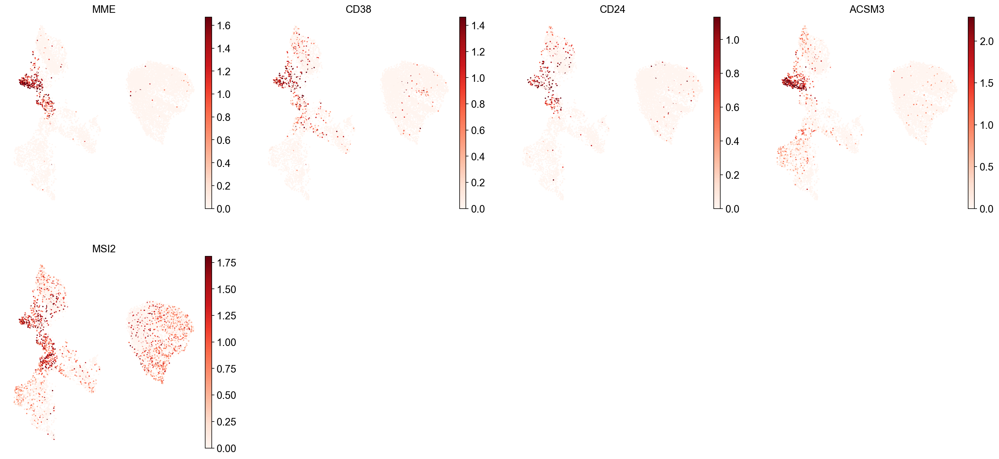





PLASMA CELLS:


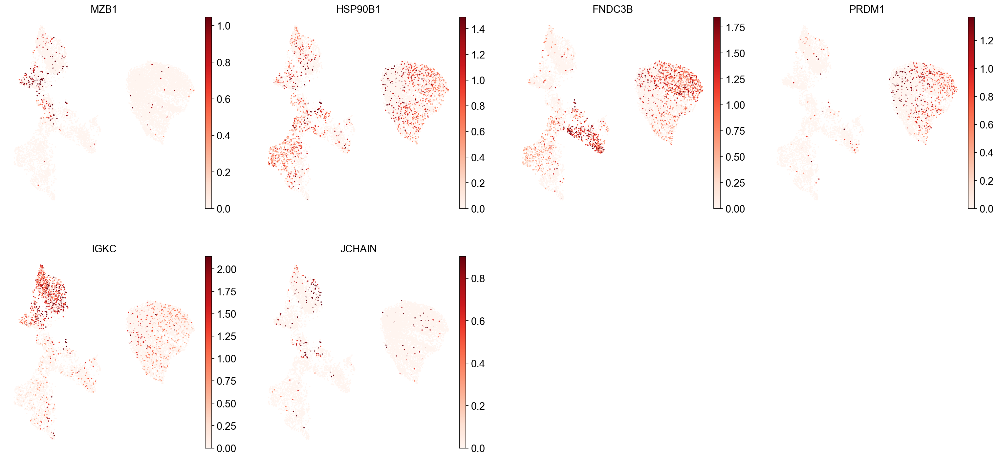





PLASMABLAST:


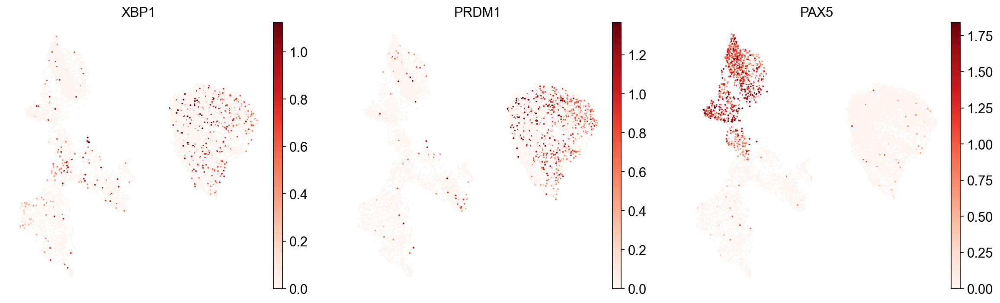

In [19]:
# 定义B细胞和浆细胞亚群的列表
B_plasma_cts = [
    "Naive CD20+ B",  # 初始B细胞
    "B1 B",           # B1 B细胞
    "Transitional B", # 过渡B细胞
    "Plasma cells",   # 浆细胞
    "Plasmablast",    # 浆母细胞
]

# 遍历B细胞和浆细胞亚群
for ct in B_plasma_cts:
    # 打印当前细胞亚群的名称（大写）
    print(f"{ct.upper()}:")

    # 绘制UMAP图，展示该亚群的标记基因表达
    sc.pl.umap(
        adata,
        color=marker_genes_in_data[ct],  # 使用该亚群的标记基因
        vmin=0,  # 设置颜色范围的最小值为0
        vmax="p99",  # 设置颜色范围的最大值为基因表达量的99百分位数，避免极端值影响可视化
        sort_order=False,  # 不按表达量排序，避免高表达细胞掩盖其他细胞的表达模式
        frameon=False,  # 不显示图的边框
        cmap="Reds",  # 使用红色调色板（其他调色板可参考：https://matplotlib.org/stable/tutorials/colors/colormaps.html）
    )

    print("\n\n\n")

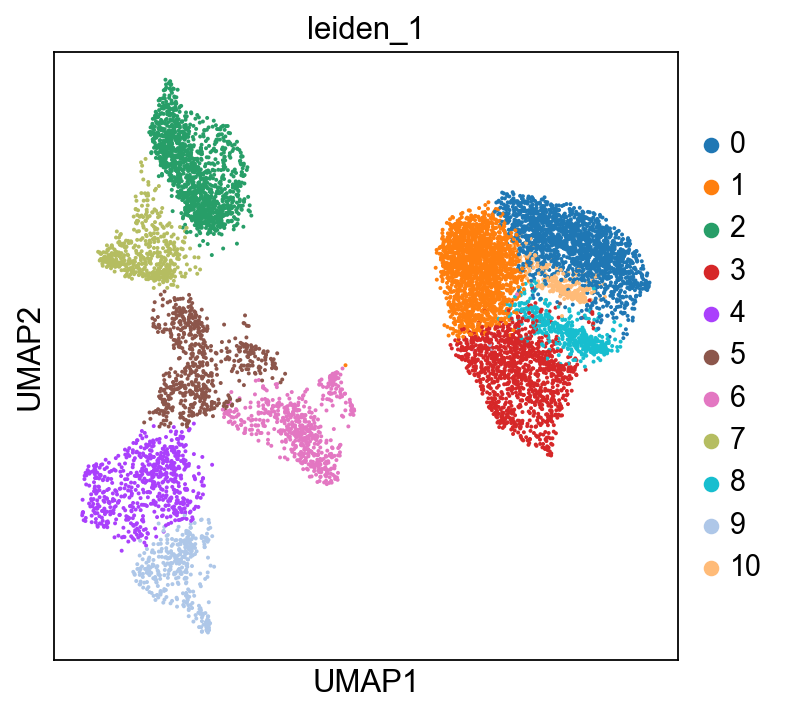

In [20]:
sc.tl.leiden(adata, resolution=1, key_added="leiden_1")
sc.pl.umap(adata, color="leiden_1")

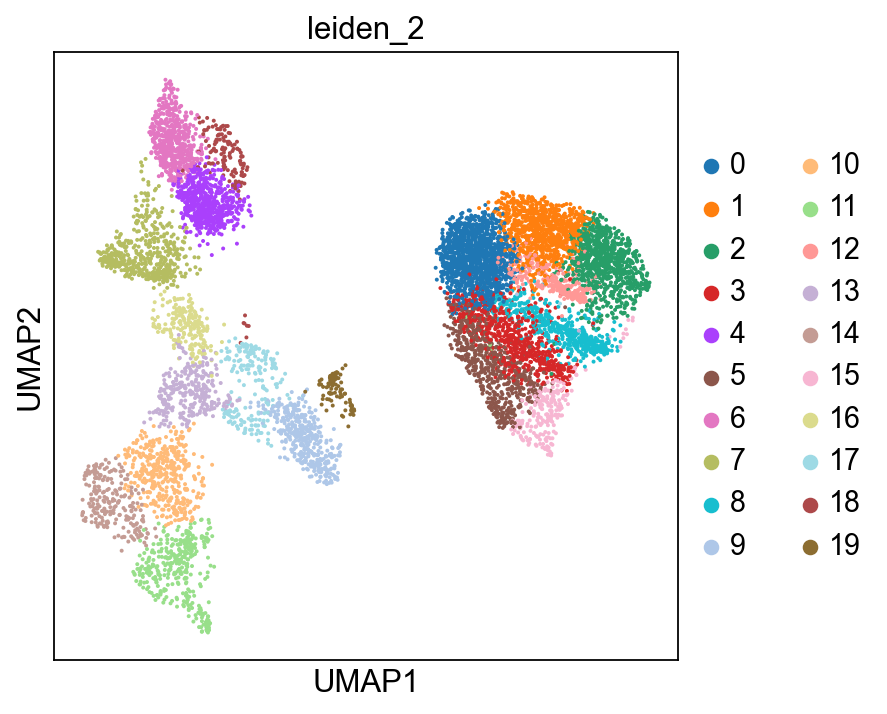

In [21]:
sc.tl.leiden(adata, resolution=2, key_added="leiden_2")
sc.pl.umap(adata, color="leiden_2")

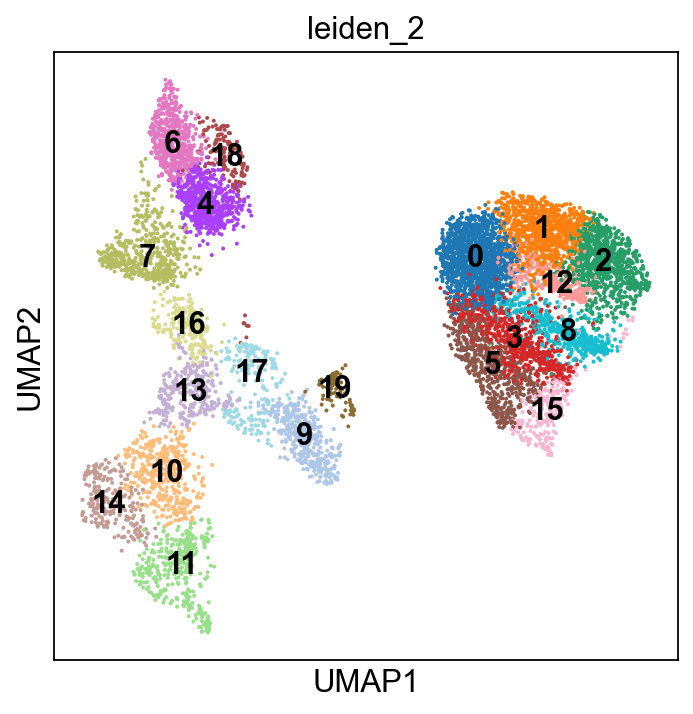

In [22]:
sc.pl.umap(adata, color="leiden_2", legend_loc="on data")

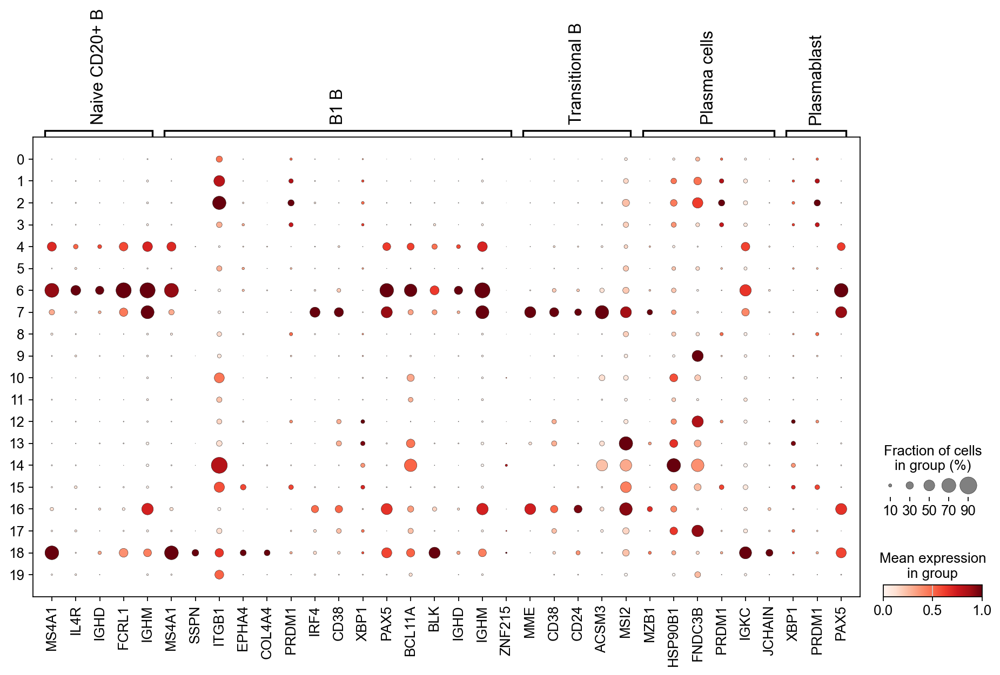

In [23]:
# 构建B细胞和浆细胞亚群的标记基因字典（仅包含存在于当前数据集中的基因）
B_plasma_markers = {
    # ct: 细胞类型名称（如"Plasma cells"）
    # ct_markers: 该细胞类型的预设标记基因列表
    ct: [m for m in ct_markers if m in adata.var.index]  # 筛选存在于数据集的基因
    
    # 遍历预设的标记基因字典，仅保留属于B_plasma_cts的细胞类型
    for ct, ct_markers in marker_genes.items()
    if ct in B_plasma_cts  # B_plasma_cts = ["Naive CD20+ B", "Plasma cells", ...]
}

# 生成点图（dot plot）可视化标记基因表达
sc.pl.dotplot(
    adata,                          # AnnData对象
    groupby="leiden_2",             # 按聚类结果（leiden_2分辨率）分组
    var_names=B_plasma_markers,     # 使用的标记基因字典
    standard_scale="var",           # 按基因标准化（每基因表达量缩放到0-1范围）
)

In [24]:
cl_annotation = {
    "4": "Naive CD20+ B",
    "6": "Naive CD20+ B",
    "8": "Transitional B",
    "18": "B1 B",  # note that IGHD and IGHM are negative markers, in this case more lowly expressed than in the other B cell clusters
}

... storing 'manual_celltype_annotation' as categorical


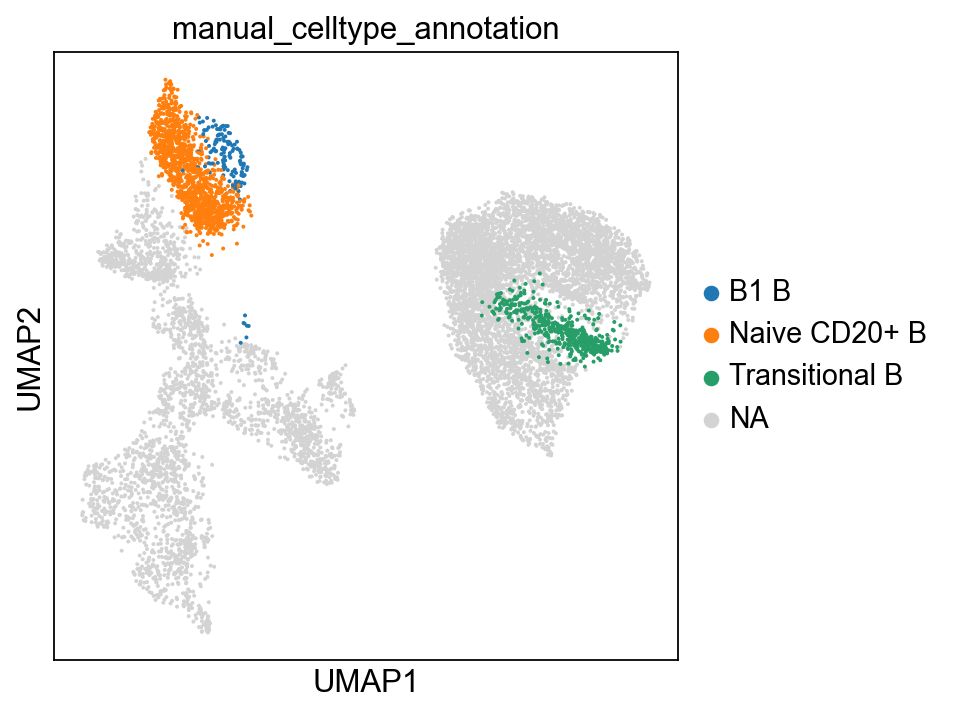

In [25]:
adata.obs["manual_celltype_annotation"] = adata.obs.leiden_2.map(cl_annotation)
sc.pl.umap(adata, color=["manual_celltype_annotation"])

##### 从簇差异表达基因注释细胞

In [26]:
# 对聚类结果（leiden_2）进行差异表达分析
sc.tl.rank_genes_groups(
    adata, 
    groupby="leiden_2",   # 按leiden_2聚类分组
    method="wilcoxon",    # 使用Wilcoxon秩和检验（适用于单细胞数据）
    key_added="dea_leiden_2"  # 结果存储在adata.uns["dea_leiden_2"]
)

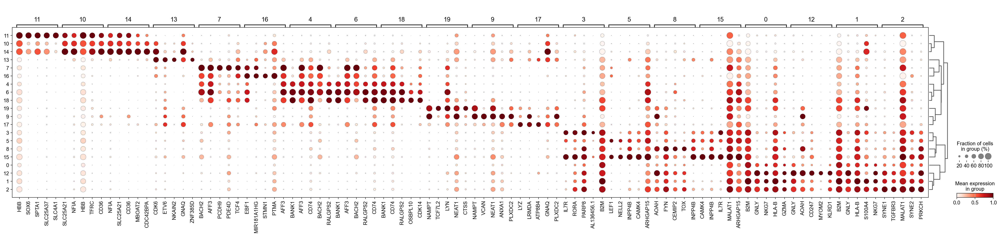

In [27]:
# 绘制差异基因点图
sc.pl.rank_genes_groups_dotplot(
    adata,
    groupby="leiden_2",     # 按leiden_2分组
    standard_scale="var",  # 按基因标准化（横向0-1）
    n_genes=5,             # 每个簇显示前5个差异基因
    key="dea_leiden_2"     # 使用上述差异分析结果
)

In [28]:
sc.tl.filter_rank_genes_groups(
    adata,
    min_in_group_fraction=0.2,  # 目标组中至少20%细胞表达该基因
    max_out_group_fraction=0.2,  # 其他组中最多20%细胞表达该基因
    key="dea_leiden_2",           # 使用之前差异分析结果
    key_added="dea_leiden_2_filtered",  # 过滤后的结果存入新键
)

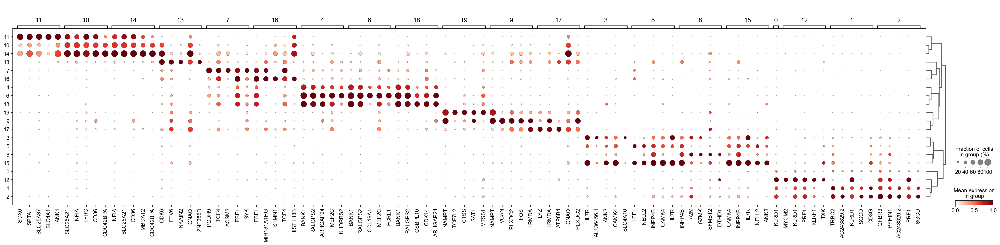

In [29]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    groupby="leiden_2",     # 按聚类分组
    standard_scale="var",   # 横向标准化（每基因表达量缩放到0-1）
    n_genes=5,              # 每个簇显示前5个特异性基因
    key="dea_leiden_2_filtered",  # 使用过滤后的差异基因结果
)

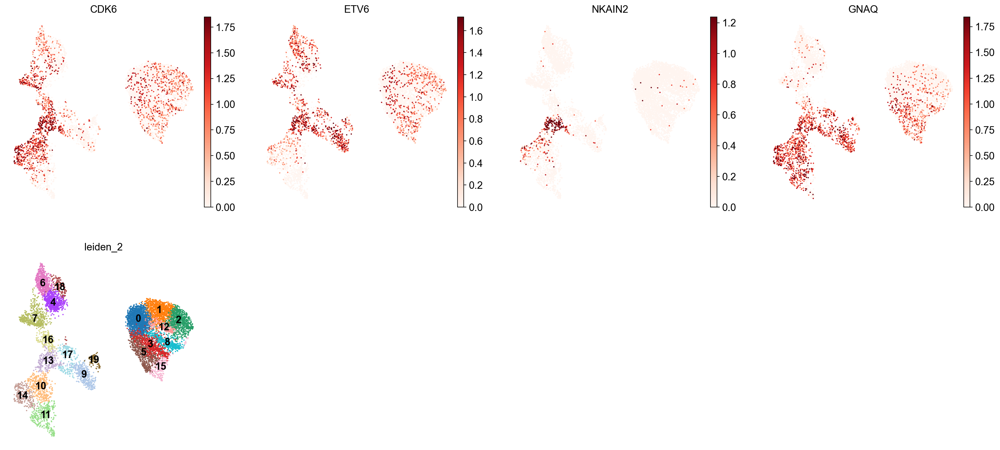

In [30]:
sc.pl.umap(
    adata,
    color=["CDK6", "ETV6", "NKAIN2", "GNAQ", "leiden_2"],  # 同时显示基因表达和聚类标签
    vmax="p99",            # 颜色上限设为基因表达量的99百分位数
    legend_loc="on data",  # 将聚类标签直接标注在UMAP图上
    frameon=False,         # 隐藏边框
    cmap="Reds",           # 红色渐变调色板
)

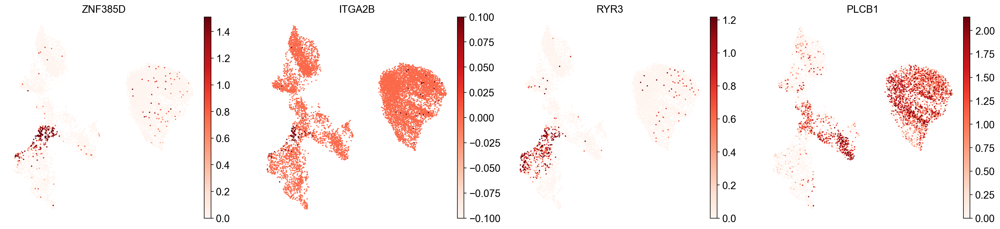

In [31]:
sc.pl.umap(
    adata,
    color=["ZNF385D", "ITGA2B", "RYR3", "PLCB1"],  
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

### 自动注释

In [32]:
adata_celltypist = adata.copy()  # make a copy of our adata
adata_celltypist.X = adata.layers["counts"]  # set adata.X to raw counts
sc.pp.normalize_per_cell(
    adata_celltypist, counts_per_cell_after=10**4
)  # normalize to 10,000 counts per cell
sc.pp.log1p(adata_celltypist)  # log-transform
# make .X dense instead of sparse, for compatibility with celltypist:
adata_celltypist.X = adata_celltypist.X.toarray()

In [33]:
models.download_models(
    force_update=True, model=["Immune_All_Low.pkl", "Immune_All_High.pkl"]
)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 54
📂 Storing models in C:\Users\Administrator\.celltypist\data\models
💾 Total models to download: 2
💾 Downloading model [1/2]: Immune_All_Low.pkl
💾 Downloading model [2/2]: Immune_All_High.pkl


In [34]:
model_low = models.Model.load(model="Immune_All_Low.pkl")
model_high = models.Model.load(model="Immune_All_High.pkl")

In [35]:
model_high.cell_types

array(['B cells', 'B-cell lineage', 'Cycling cells', 'DC', 'DC precursor',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ETP',
       'Early MK', 'Endothelial cells', 'Epithelial cells',
       'Erythrocytes', 'Erythroid', 'Fibroblasts', 'Granulocytes',
       'HSC/MPP', 'ILC', 'ILC precursor', 'MNP', 'Macrophages',
       'Mast cells', 'Megakaryocyte precursor',
       'Megakaryocytes/platelets', 'Mono-mac', 'Monocyte precursor',
       'Monocytes', 'Myelocytes', 'Plasma cells', 'Promyelocytes',
       'T cells', 'pDC', 'pDC precursor'], dtype=object)

In [36]:
model_low.cell_types

array(['Age-associated B cells', 'Alveolar macrophages', 'B cells',
       'CD16+ NK cells', 'CD16- NK cells', 'CD8a/a', 'CD8a/b(entry)',
       'CMP', 'CRTAM+ gamma-delta T cells', 'Classical monocytes',
       'Cycling B cells', 'Cycling DCs', 'Cycling NK cells',
       'Cycling T cells', 'Cycling gamma-delta T cells',
       'Cycling monocytes', 'DC', 'DC precursor', 'DC1', 'DC2', 'DC3',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ELP',
       'ETP', 'Early MK', 'Early erythroid', 'Early lymphoid/T lymphoid',
       'Endothelial cells', 'Epithelial cells', 'Erythrocytes',
       'Erythrophagocytic macrophages', 'Fibroblasts',
       'Follicular B cells', 'Follicular helper T cells', 'GMP',
       'Germinal center B cells', 'Granulocytes', 'HSC/MPP',
       'Hofbauer cells', 'ILC', 'ILC precursor', 'ILC1', 'ILC2', 'ILC3',
       'Intermediate macrophages', 'Intestinal macrophages',
       'Kidney-resident macrophages', 'Kupffer cells',
       'Large pre-B cell

In [37]:
predictions_high = celltypist.annotate(
    adata_celltypist, model=model_high, majority_voting=True
)

🔬 Input data has 9370 cells and 31208 genes
🔗 Matching reference genes in the model
🧬 6047 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [38]:
predictions_high_adata = predictions_high.to_adata()

In [39]:
adata.obs["celltypist_cell_label_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "conf_score"
]

In [40]:
predictions_low = celltypist.annotate(
    adata_celltypist, model=model_low, majority_voting=True
)

🔬 Input data has 9370 cells and 31208 genes
🔗 Matching reference genes in the model
🧬 6047 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [41]:
predictions_low_adata = predictions_low.to_adata()

In [42]:
adata.obs["celltypist_cell_label_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "conf_score"
]

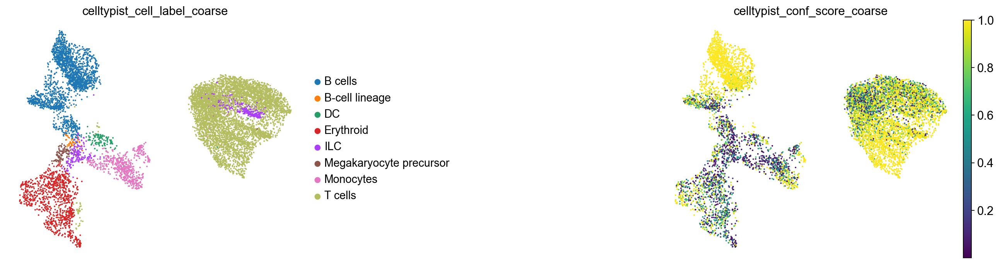

In [43]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_coarse", "celltypist_conf_score_coarse"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

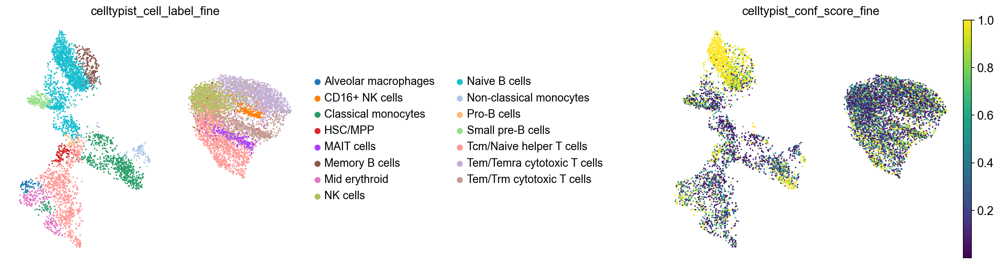

In [44]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_fine", "celltypist_conf_score_fine"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

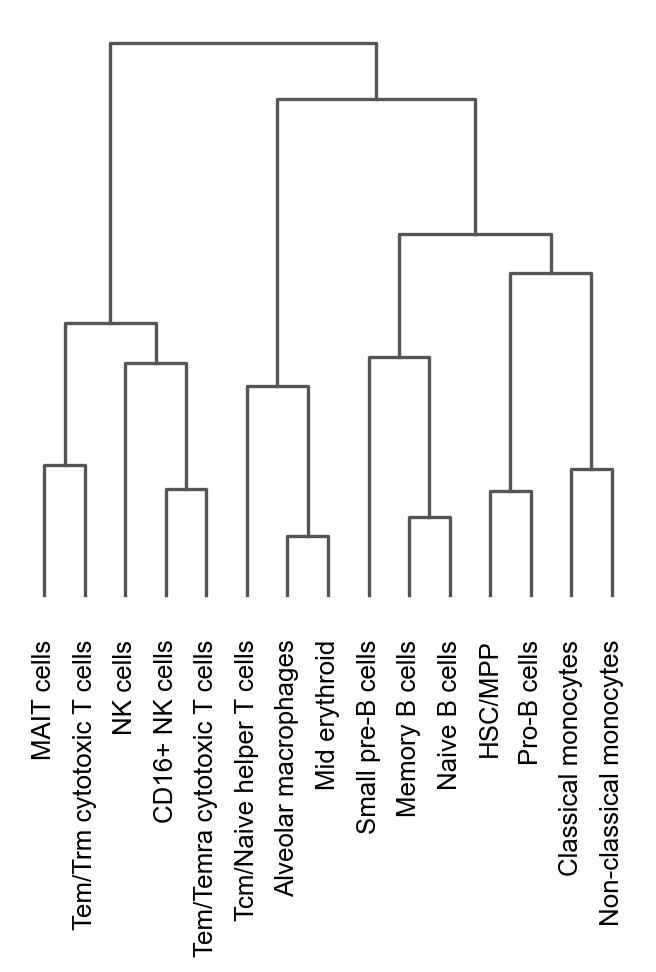

<Axes: >

In [45]:
sc.pl.dendrogram(adata, groupby="celltypist_cell_label_fine")

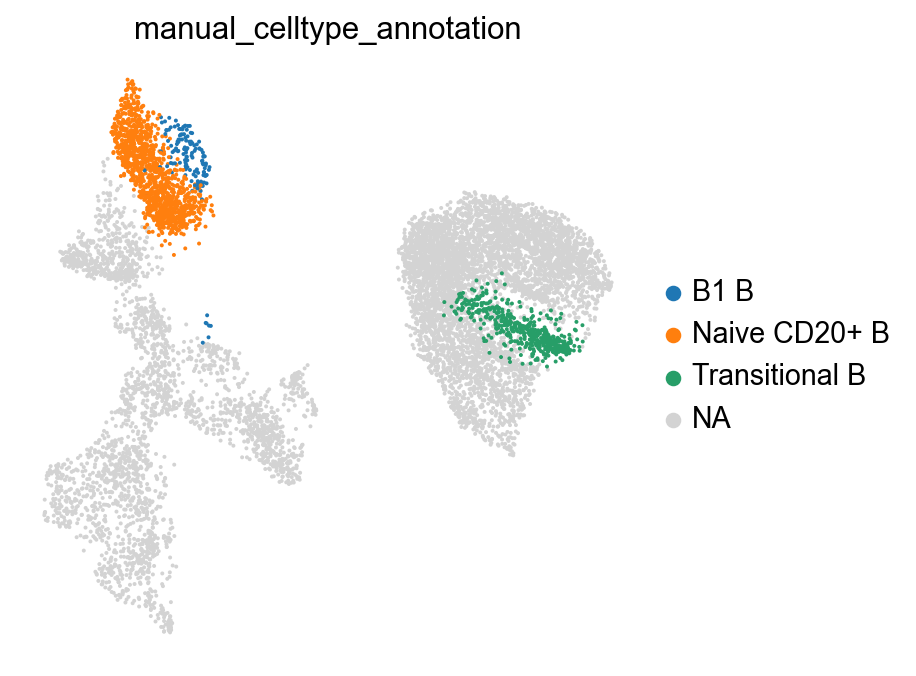

In [46]:
sc.pl.umap(
    adata,
    color=["manual_celltype_annotation"],
    frameon=False,
)

In [47]:
pd.crosstab(adata.obs.leiden_2, adata.obs.celltypist_cell_label_fine).loc[
    "12", :
].sort_values(ascending=False)

celltypist_cell_label_fine
CD16+ NK cells                 216
NK cells                        67
Tem/Temra cytotoxic T cells      8
Tem/Trm cytotoxic T cells        2
Tcm/Naive helper T cells         1
Alveolar macrophages             0
Classical monocytes              0
HSC/MPP                          0
MAIT cells                       0
Memory B cells                   0
Mid erythroid                    0
Naive B cells                    0
Non-classical monocytes          0
Pro-B cells                      0
Small pre-B cells                0
Name: 12, dtype: int64

In [48]:
pd.crosstab(adata.obs.leiden_2, adata.obs.celltypist_cell_label_coarse).loc[
    "12", :
].sort_values(ascending=False)

celltypist_cell_label_coarse
ILC                        252
T cells                     42
B cells                      0
B-cell lineage               0
DC                           0
Erythroid                    0
Megakaryocyte precursor      0
Monocytes                    0
Name: 12, dtype: int64

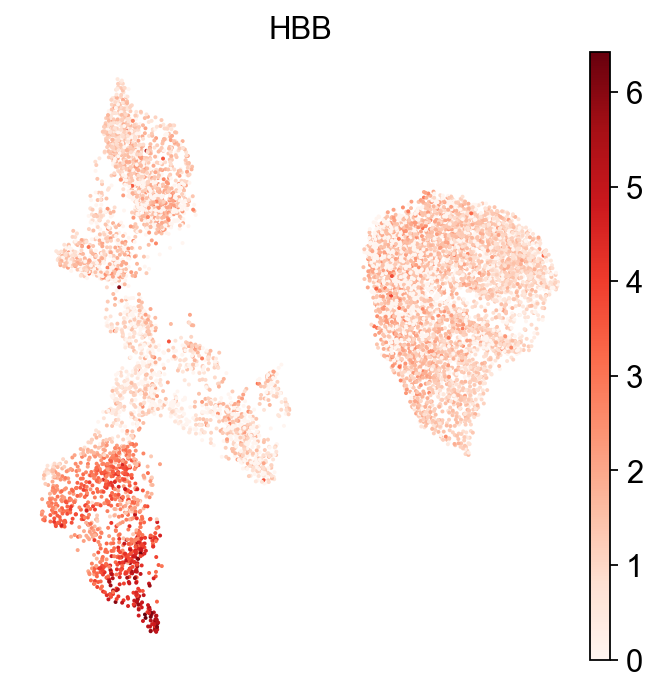

In [49]:
sc.pl.umap(adata, color="HBB", cmap="Reds", frameon=False, sort_order=False)

In [50]:
adata_to_map = adata.copy()
for layer in list(adata_to_map.layers.keys()):
    if layer != "counts":
        del adata_to_map.layers[layer]
adata_to_map.X = adata_to_map.layers["counts"]

In [51]:
reference_model_features = pd.read_csv(
    "https://figshare.com/ndownloader/files/41436645", index_col=0
)

In [52]:
adata_to_map.var["gene_names"] = adata_to_map.var.index
adata_to_map.var.set_index("gene_ids", inplace=True)

In [53]:
reference_model_features["gene_names"] = reference_model_features.index
reference_model_features.set_index("gene_ids", inplace=True)

In [54]:
print("Total number of genes needed for mapping:", reference_model_features.shape[0])

Total number of genes needed for mapping: 4000


In [55]:
print(
    "Number of genes found in query dataset:",
    adata_to_map.var.index.isin(reference_model_features.index).sum(),
)

Number of genes found in query dataset: 3998


In [56]:
missing_genes = [
    gene_id
    for gene_id in reference_model_features.index
    if gene_id not in adata_to_map.var.index
]

In [57]:
missing_gene_adata = sc.AnnData(
    X=csr_matrix(np.zeros(shape=(adata.n_obs, len(missing_genes))), dtype="float32"),
    obs=adata.obs.iloc[:, :1],
    var=reference_model_features.loc[missing_genes, :],
)
missing_gene_adata.layers["counts"] = missing_gene_adata.X

In [58]:
if "PCs" in adata_to_map.varm.keys():
    del adata_to_map.varm["PCs"]

In [59]:
adata_to_map_augmented = sc.concat(
    [adata_to_map, missing_gene_adata],
    axis=1,
    join="outer",
    index_unique=None,
    merge="unique",
)

In [60]:
adata_to_map_augmented = adata_to_map_augmented[
    :, reference_model_features.index
].copy()

In [61]:
(adata_to_map_augmented.var.index == reference_model_features.index).all()

True

In [62]:
adata_to_map_augmented.var["gene_ids"] = adata_to_map_augmented.var.index
adata_to_map_augmented.var.set_index("gene_names", inplace=True)

In [63]:
adata_to_map_augmented.obs.batch.unique()

['12']
Categories (1, object): ['12']